<a href="https://colab.research.google.com/github/Piyumi22/UCSD-Microgrid-Database/blob/master/PV_Energy_Forecasting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 0.Importing the Libraries

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import random

import matplotlib.pyplot as plt
import os

import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.offline as pyo

import os
import datetime

import IPython
import IPython.display

import tensorflow as tf


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#1.EDA on weather data

we use the same EDA process which used to forecast wind speed except feature engineering

In [ ]:
# Load the CSV file into a DataFrame
file_path = '/content/drive/MyDrive/FYRP/ME420-RESEARCH/UCSD Microgrid Database/Data Files/weather_data.csv'
weather_data = pd.read_csv(file_path)


In [ ]:
data=weather_data.copy()

##1.1data preprocessing

**Sort and remove duplicates**

In [ ]:
data['DateTime'] = pd.to_datetime(data['time'], format='%Y-%m-%d %H:%M:%S')  # Convert 'time' column to datetime format.
data = data.drop_duplicates(subset='DateTime')  # Drop duplicates of DateTime.
data.set_index('DateTime', inplace=True)  # Set 'DateTime' as the index.
data = data.sort_index()  # Sort data according to index.
data.pop ('Unnamed: 0') #pop removes feature from dataframe
data.pop ('time')

DateTime
2015-01-21 00:00:00    2015-01-21 00:00:00
2015-01-21 01:00:00    2015-01-21 01:00:00
2015-01-21 02:00:00    2015-01-21 02:00:00
2015-01-21 03:00:00    2015-01-21 03:00:00
2015-01-21 04:00:00    2015-01-21 04:00:00
                              ...         
2020-02-29 19:00:00    2020-02-29 19:00:00
2020-02-29 20:00:00    2020-02-29 20:00:00
2020-02-29 21:00:00    2020-02-29 21:00:00
2020-02-29 22:00:00    2020-02-29 22:00:00
2020-02-29 23:00:00    2020-02-29 23:00:00
Name: time, Length: 44784, dtype: object

# Feature engineering
-remove some specific features; 'snow', 'wpgt', 'tsun', 'coco' has no value or just one year data.
'prcp' has many missing values and has less correlation between any of features.



In [ ]:
import pandas as pd

features_to_remove = [ 'snow', 'wpgt', 'tsun', 'coco','prcp']#  list of features to remove

# Double-check that features exist in the DataFrame
for feature in features_to_remove:
    if feature not in data.columns:
        print(f"Warning: Feature '{feature}' not found in DataFrame.")

data = data.drop(features_to_remove, axis=1)# Drop the specified features

###**fill missing values**

In [ ]:
#fill features with last non nan value or prev non nan value
data.fillna(method='ffill', inplace=True)
# Alternatively, use the fillna method with pad (which is equivalent to forward-fill)
data.fillna(method='pad', inplace=True)
print(data.isna().sum())

temp    0
dwpt    0
rhum    0
wdir    0
wspd    0
pres    0
dtype: int64


###**Wind**


wdir (deg)—gives the wind direction in units of degrees. Angles do not make good model inputs: 360° and 0° should be close to each other and wrap around smoothly. Direction shouldn't matter if the wind is not blowing.

the distribution of wind data;

In [ ]:
data['wspd'].max()

59.4

Text(0, 0.5, 'Wind speed [m/s]')

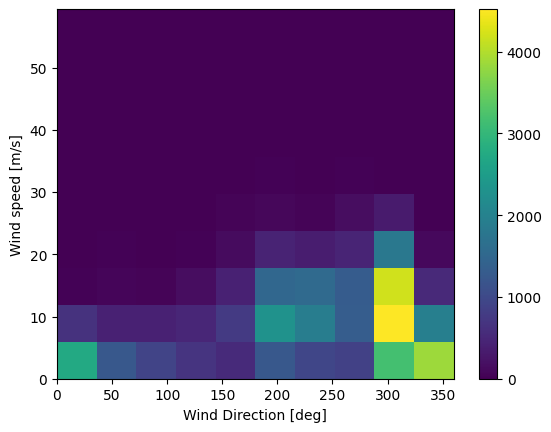

In [ ]:
plt.hist2d(data['wdir'], data['wspd'] )
plt.colorbar()
plt.xlabel('Wind Direction [deg]')
plt.ylabel('Wind speed [m/s]')

convert the wind direction and velocity columns to a wind vector:

In [ ]:
wspd = data.pop('wspd')

# Convert to radians.
wd_rad = data.pop('wdir')*np.pi / 180 #pop remove values from data

# Calculate the wind x and y components.
data['Wx'] = wspd*np.cos(wd_rad)
data['Wy'] = wspd*np.sin(wd_rad)

The distribution of wind vectors

(-51.44190898479566, 30.57069675359067, -51.013041606032374, 34.16558216310642)

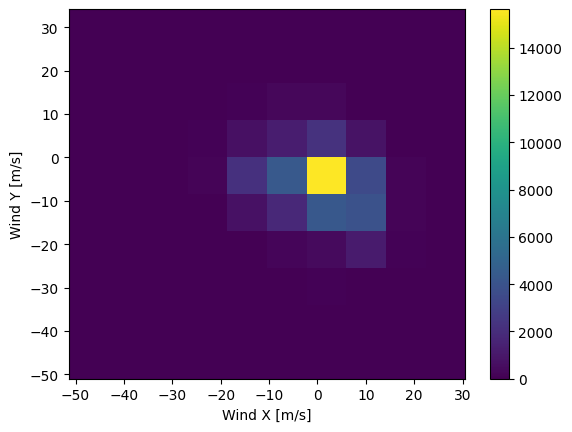

In [ ]:
plt.hist2d(data['Wx'], data['Wy'])
plt.colorbar()
plt.xlabel('Wind X [m/s]')
plt.ylabel('Wind Y [m/s]')
ax = plt.gca()
ax.axis('tight')

#Load PV data

In [ ]:
# Load the CSV file into a DataFrame
file_path = '/content/drive/MyDrive/FYRP/ME420-RESEARCH/UCSD Microgrid Database/Data Files/PV_Energy_data3.csv'
pv_data=pd.read_csv(file_path)
print(pv_data)

                     index  MeanPower            Date_Time
0      2015-02-01 00:00:00   0.000000  2015-02-01 00:00:00
1      2015-02-01 01:00:00   0.000000  2015-02-01 01:00:00
2      2015-02-01 02:00:00   0.000000  2015-02-01 02:00:00
3      2015-02-01 03:00:00   0.000000  2015-02-01 03:00:00
4      2015-02-01 04:00:00   0.000000  2015-02-01 04:00:00
...                    ...        ...                  ...
44515  2020-02-29 19:00:00   0.000778  2020-02-29 19:00:00
44516  2020-02-29 20:00:00   0.000779  2020-02-29 20:00:00
44517  2020-02-29 21:00:00   0.000778  2020-02-29 21:00:00
44518  2020-02-29 22:00:00   0.000776  2020-02-29 22:00:00
44519  2020-02-29 23:00:00   0.000775  2020-02-29 23:00:00

[44520 rows x 3 columns]


In [ ]:
pv_data['Date_Time']=pd.to_datetime(pv_data['Date_Time']) #convert to datetime
#pv_data.set_index('Date_Time', inplace=True)
print(pv_data)

                     index  MeanPower           Date_Time
0      2015-02-01 00:00:00   0.000000 2015-02-01 00:00:00
1      2015-02-01 01:00:00   0.000000 2015-02-01 01:00:00
2      2015-02-01 02:00:00   0.000000 2015-02-01 02:00:00
3      2015-02-01 03:00:00   0.000000 2015-02-01 03:00:00
4      2015-02-01 04:00:00   0.000000 2015-02-01 04:00:00
...                    ...        ...                 ...
44515  2020-02-29 19:00:00   0.000778 2020-02-29 19:00:00
44516  2020-02-29 20:00:00   0.000779 2020-02-29 20:00:00
44517  2020-02-29 21:00:00   0.000778 2020-02-29 21:00:00
44518  2020-02-29 22:00:00   0.000776 2020-02-29 22:00:00
44519  2020-02-29 23:00:00   0.000775 2020-02-29 23:00:00

[44520 rows x 3 columns]


In [ ]:
pv_data.set_index('Date_Time', inplace=True)  # Set 'Date_Time' as the index.
pv_data = pv_data.sort_index()  # Sort pv_data according to index.
print(pv_data)

                                   index  MeanPower
Date_Time                                          
2015-02-01 00:00:00  2015-02-01 00:00:00   0.000000
2015-02-01 01:00:00  2015-02-01 01:00:00   0.000000
2015-02-01 02:00:00  2015-02-01 02:00:00   0.000000
2015-02-01 03:00:00  2015-02-01 03:00:00   0.000000
2015-02-01 04:00:00  2015-02-01 04:00:00   0.000000
...                                  ...        ...
2020-02-29 19:00:00  2020-02-29 19:00:00   0.000778
2020-02-29 20:00:00  2020-02-29 20:00:00   0.000779
2020-02-29 21:00:00  2020-02-29 21:00:00   0.000778
2020-02-29 22:00:00  2020-02-29 22:00:00   0.000776
2020-02-29 23:00:00  2020-02-29 23:00:00   0.000775

[44520 rows x 2 columns]


In [ ]:
print(data)

                     temp  dwpt  rhum    pres            Wx         Wy
DateTime                                                              
2015-01-21 00:00:00  16.1  10.6  70.0  1014.3 -5.821938e+00  -4.885186
2015-01-21 01:00:00  15.6  10.6  72.0  1014.3 -2.388061e-15 -13.000000
2015-01-21 02:00:00  15.0  10.6  75.0  1014.4 -1.726752e-15  -9.400000
2015-01-21 03:00:00  15.0  10.6  75.0  1014.8 -4.885186e+00  -5.821938
2015-01-21 04:00:00  15.0  10.6  75.0  1015.0 -0.000000e+00  -0.000000
...                   ...   ...   ...     ...           ...        ...
2020-02-29 19:00:00  18.9  13.3  70.0  1019.6 -1.437602e+01  -8.300000
2020-02-29 20:00:00  19.4  14.0  71.0  1019.1 -1.281718e+01  -7.400000
2020-02-29 21:00:00  18.9  14.0  73.0  1018.3 -1.271634e+01 -10.670274
2020-02-29 22:00:00  18.9  12.9  68.0  1017.8 -9.513257e+00 -11.337458
2020-02-29 23:00:00  18.3  12.3  68.0  1017.8 -9.513257e+00 -11.337458

[44784 rows x 6 columns]


**Merge data**

In [ ]:
pv_data.pop('index')

Date_Time
2015-02-01 00:00:00    2015-02-01 00:00:00
2015-02-01 01:00:00    2015-02-01 01:00:00
2015-02-01 02:00:00    2015-02-01 02:00:00
2015-02-01 03:00:00    2015-02-01 03:00:00
2015-02-01 04:00:00    2015-02-01 04:00:00
                              ...         
2020-02-29 19:00:00    2020-02-29 19:00:00
2020-02-29 20:00:00    2020-02-29 20:00:00
2020-02-29 21:00:00    2020-02-29 21:00:00
2020-02-29 22:00:00    2020-02-29 22:00:00
2020-02-29 23:00:00    2020-02-29 23:00:00
Name: index, Length: 44520, dtype: object

In [ ]:
# Extract the 'Value' column from data
#value_column = pv_data[['MeanPower']]
# Concatenate pv_data and the extracted 'Value' column along the columns (axis=1)
merged_df = pd.concat([data, pv_data], axis=1)
#merged_df.reset_index(inplace=True)
print(merged_df)

                     temp  dwpt  rhum    pres            Wx         Wy  \
2015-01-21 00:00:00  16.1  10.6  70.0  1014.3 -5.821938e+00  -4.885186   
2015-01-21 01:00:00  15.6  10.6  72.0  1014.3 -2.388061e-15 -13.000000   
2015-01-21 02:00:00  15.0  10.6  75.0  1014.4 -1.726752e-15  -9.400000   
2015-01-21 03:00:00  15.0  10.6  75.0  1014.8 -4.885186e+00  -5.821938   
2015-01-21 04:00:00  15.0  10.6  75.0  1015.0 -0.000000e+00  -0.000000   
...                   ...   ...   ...     ...           ...        ...   
2020-02-29 19:00:00  18.9  13.3  70.0  1019.6 -1.437602e+01  -8.300000   
2020-02-29 20:00:00  19.4  14.0  71.0  1019.1 -1.281718e+01  -7.400000   
2020-02-29 21:00:00  18.9  14.0  73.0  1018.3 -1.271634e+01 -10.670274   
2020-02-29 22:00:00  18.9  12.9  68.0  1017.8 -9.513257e+00 -11.337458   
2020-02-29 23:00:00  18.3  12.3  68.0  1017.8 -9.513257e+00 -11.337458   

                     MeanPower  
2015-01-21 00:00:00        NaN  
2015-01-21 01:00:00        NaN  
2015-01-21 0

In [ ]:
print(merged_df.isna().sum())

temp           0
dwpt           0
rhum           0
pres           0
Wx             0
Wy             0
MeanPower    269
dtype: int64


In [ ]:
from google.colab import data_table
#data_table.DataTable(merged_df.tail(2000))
data_table.DataTable(merged_df)

,temp,dwpt,rhum,pres,Wx,Wy,MeanPower
2015-01-21 00:00:00,16.1,10.6,70.0,1014.3,-5.821938e+00,-4.885186,NaN
2015-01-21 01:00:00,15.6,10.6,72.0,1014.3,-2.388061e-15,-13.000000,NaN
2015-01-21 02:00:00,15.0,10.6,75.0,1014.4,-1.726752e-15,-9.400000,NaN
2015-01-21 03:00:00,15.0,10.6,75.0,1014.8,-4.885186e+00,-5.821938,NaN
2015-01-21 04:00:00,15.0,10.6,75.0,1015.0,-0.000000e+00,-0.000000,NaN
...,...,...,...,...,...,...,...
2020-02-29 19:00:00,18.9,13.3,70.0,1019.6,-1.437602e+01,-8.300000,0.000778
2020-02-29 20:00:00,19.4,14.0,71.0,1019.1,-1.281718e+01,-7.400000,0.000779
2020-02-29 21:00:00,18.9,14.0,73.0,1018.3,-1.271634e+01,-10.670274,0.000778
2020-02-29 22:00:00,18.9,12.9,68.0,1017.8,-9.513257e+00,-11.337458,0.000776


In [ ]:
print(merged_df)

                     temp  dwpt  rhum    pres            Wx         Wy  \
2015-01-21 00:00:00  16.1  10.6  70.0  1014.3 -5.821938e+00  -4.885186   
2015-01-21 01:00:00  15.6  10.6  72.0  1014.3 -2.388061e-15 -13.000000   
2015-01-21 02:00:00  15.0  10.6  75.0  1014.4 -1.726752e-15  -9.400000   
2015-01-21 03:00:00  15.0  10.6  75.0  1014.8 -4.885186e+00  -5.821938   
2015-01-21 04:00:00  15.0  10.6  75.0  1015.0 -0.000000e+00  -0.000000   
...                   ...   ...   ...     ...           ...        ...   
2020-02-29 19:00:00  18.9  13.3  70.0  1019.6 -1.437602e+01  -8.300000   
2020-02-29 20:00:00  19.4  14.0  71.0  1019.1 -1.281718e+01  -7.400000   
2020-02-29 21:00:00  18.9  14.0  73.0  1018.3 -1.271634e+01 -10.670274   
2020-02-29 22:00:00  18.9  12.9  68.0  1017.8 -9.513257e+00 -11.337458   
2020-02-29 23:00:00  18.3  12.3  68.0  1017.8 -9.513257e+00 -11.337458   

                     MeanPower  
2015-01-21 00:00:00        NaN  
2015-01-21 01:00:00        NaN  
2015-01-21 0

In [ ]:
merged_df['Due']=merged_df.index

In [ ]:

# Specify the start time
start_time = '2016-01-01 00:00:00'
# Filter the DataFrame to include only rows with DateTime greater than or equal to the start time
merged_df = merged_df[merged_df['Due'] >= start_time]

# Display the updated DataFrame
print(merged_df)


                     temp  dwpt  rhum    pres         Wx         Wy  \
2016-01-01 00:00:00  16.1   5.1  48.0  1017.6   7.199221  -8.579698   
2016-01-01 01:00:00  15.6   5.5  51.0  1018.1   7.200818  -6.042204   
2016-01-01 02:00:00  14.4   4.4  51.0  1018.3   7.141664  -2.599353   
2016-01-01 03:00:00  13.9   4.5  53.0  1018.7   0.000000  -0.000000   
2016-01-01 04:00:00  13.3   4.4  55.0  1018.7   0.000000  -0.000000   
...                   ...   ...   ...     ...        ...        ...   
2020-02-29 19:00:00  18.9  13.3  70.0  1019.6 -14.376022  -8.300000   
2020-02-29 20:00:00  19.4  14.0  71.0  1019.1 -12.817176  -7.400000   
2020-02-29 21:00:00  18.9  14.0  73.0  1018.3 -12.716338 -10.670274   
2020-02-29 22:00:00  18.9  12.9  68.0  1017.8  -9.513257 -11.337458   
2020-02-29 23:00:00  18.3  12.3  68.0  1017.8  -9.513257 -11.337458   

                     MeanPower                 Due  
2016-01-01 00:00:00   0.000304 2016-01-01 00:00:00  
2016-01-01 01:00:00   0.000303 2016-01-01

In [ ]:
print(merged_df.isna().sum())

temp         0
dwpt         0
rhum         0
pres         0
Wx           0
Wy           0
MeanPower    4
Due          0
dtype: int64


In [ ]:
print(merged_df[merged_df.isna().any(axis=1)])

                     temp  dwpt  rhum    pres         Wx         Wy  \
2016-03-13 02:00:00  16.1   7.3  56.0  1022.3   2.882560 -16.347809   
2017-03-12 02:00:00  15.6  11.8  78.0  1016.0   6.042204  -7.200818   
2018-03-11 02:00:00  15.0  14.4  96.0  1015.7 -13.907451   5.061898   
2019-03-10 02:00:00  13.3   3.9  53.0  1015.9   8.356239  -9.958578   

                     MeanPower                 Due  
2016-03-13 02:00:00        NaN 2016-03-13 02:00:00  
2017-03-12 02:00:00        NaN 2017-03-12 02:00:00  
2018-03-11 02:00:00        NaN 2018-03-11 02:00:00  
2019-03-10 02:00:00        NaN 2019-03-10 02:00:00  


In [ ]:
#fill features with last non nan value or prev non nan value
merged_df.fillna(method='ffill', inplace=True)
# Alternatively, use the fillna method with pad (which is equivalent to forward-fill)
merged_df.fillna(method='pad', inplace=True)

<ipython-input-134-c3355472ca0c>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-134-c3355472ca0c>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
print(merged_df.isna().sum())

temp         0
dwpt         0
rhum         0
pres         0
Wx           0
Wy           0
MeanPower    0
Due          0
dtype: int64


In [ ]:
df=merged_df.copy()

In [ ]:
df.pop('Due')

2016-01-01 00:00:00   2016-01-01 00:00:00
2016-01-01 01:00:00   2016-01-01 01:00:00
2016-01-01 02:00:00   2016-01-01 02:00:00
2016-01-01 03:00:00   2016-01-01 03:00:00
2016-01-01 04:00:00   2016-01-01 04:00:00
                              ...        
2020-02-29 19:00:00   2020-02-29 19:00:00
2020-02-29 20:00:00   2020-02-29 20:00:00
2020-02-29 21:00:00   2020-02-29 21:00:00
2020-02-29 22:00:00   2020-02-29 22:00:00
2020-02-29 23:00:00   2020-02-29 23:00:00
Freq: H, Name: Due, Length: 36504, dtype: datetime64[ns]

In [ ]:
print(df.isna().sum())

temp         0
dwpt         0
rhum         0
pres         0
Wx           0
Wy           0
MeanPower    0
dtype: int64


## multiply

#**Time**

Similarly, the Date Time column is very useful, but not in this string form. Start by converting it to seconds:

In [ ]:
timestamp_s = df.index.map(pd.Timestamp.timestamp)

the time in seconds is not a useful model input. Being weather data, it has clear daily and yearly periodicity.

get usable signals by using sine and cosine transforms to clear "Time of day" and "Time of year" signals:

In [ ]:
day = 24*60*60
year = (365.2425)*day

df['Day sin'] = np.sin(timestamp_s * (2 * np.pi / day))
df['Day cos'] = np.cos(timestamp_s * (2 * np.pi / day))
df['Year sin'] = np.sin(timestamp_s * (2 * np.pi / year))
df['Year cos'] = np.cos(timestamp_s * (2 * np.pi / year))

Text(0.5, 1.0, 'Time of day signal')

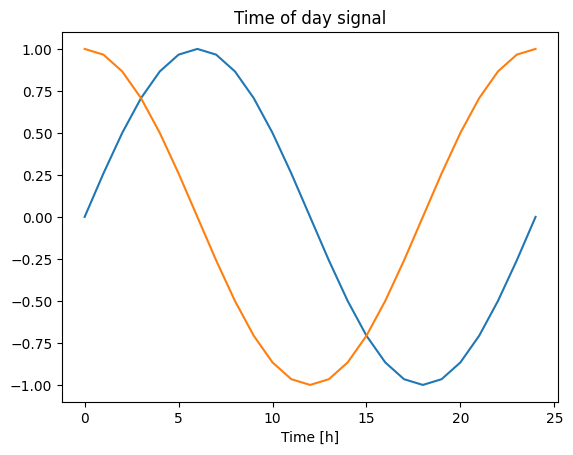

In [ ]:
plt.plot(np.array(df['Day sin'])[:25])
plt.plot(np.array(df['Day cos'])[:25])
plt.xlabel('Time [h]')
plt.title('Time of day signal')

Text(0.5, 1.0, 'Time of Year signal')

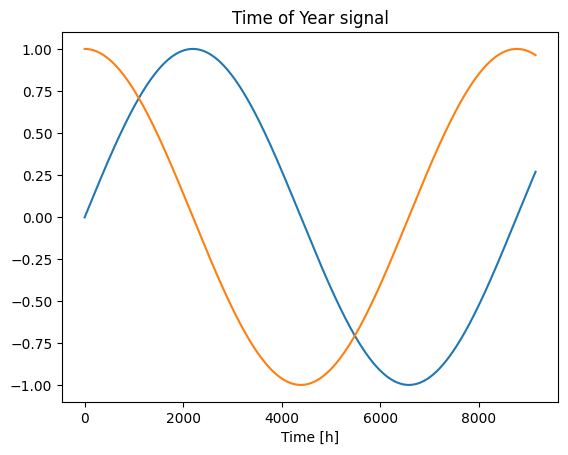

In [ ]:
plt.plot(np.array(df['Year sin'])[:25*366])
plt.plot(np.array(df['Year cos'])[:25*366])
plt.xlabel('Time [h]')
plt.title('Time of Year signal')

In [ ]:
df.describe()

,temp,dwpt,rhum,pres,Wx,Wy,MeanPower,Day sin,Day cos,Year sin,Year cos
count,36504.000000,36504.000000,36504.000000,36504.000000,36504.000000,36504.000000,36504.000000,3.650400e+04,3.650400e+04,36504.000000,36504.000000
mean,18.260339,11.446921,67.377794,1015.908500,0.382041,-4.761333,0.173215,6.451921e-15,7.068152e-16,0.018531,0.032873
std,4.039248,5.638258,17.281972,3.619935,7.428144,6.895336,0.249301,7.071165e-01,7.071165e-01,0.700839,0.712340
min,3.900000,-20.700000,4.000000,999.300000,-51.441909,-51.013042,0.000290,-1.000000e+00,-1.000000e+00,-1.000000,-1.000000
25%,15.600000,8.900000,60.000000,1013.400000,-3.800000,-9.513257,0.000776,-7.071068e-01,-7.071068e-01,-0.683866,-0.683947
50%,18.300000,12.300000,70.000000,1015.600000,0.000000,-3.800000,0.003832,1.819646e-14,-4.979055e-16,0.056986,0.064498
75%,21.100000,15.500000,79.000000,1018.200000,5.600000,0.000000,0.320111,7.071068e-01,7.071068e-01,0.705978,0.747522
max,37.800000,22.900000,100.000000,1032.500000,29.011851,34.165582,0.870354,1.000000e+00,1.000000e+00,1.000000,1.000000


#3.split the data

use a (70%, 20%, 10%) split for the training, validation, and test sets

In [ ]:
#use a (70%, 20%, 10%) split for the training, validation, and test sets
column_indices = {name: i for i, name in enumerate(df.columns)}

n = len(df)
train_df = df[0:int(n*0.7)]
val_df = df[int(n*0.7):int(n*0.9)]
test_df = df[int(n*0.9):]

num_features = df.shape[1]
print(f"no of features: {num_features}")

no of features: 11


# 4. normalize data

The mean and standard deviation should only be computed using the training data so that the models have no access to the values in the validation and test sets.

In [ ]:
# Calculate the mean and standard deviation of the training dataset
train_mean = train_df.mean()
train_std = train_df.std()

# Standardize the features of the training dataset
# Subtract the mean and divide by the standard deviation to center and scale the data
train_df = (train_df - train_mean) / train_std

# Standardize the features of the validation dataset using the mean and std from the training dataset
val_df = (val_df - train_mean) / train_std

# Standardize the features of the test dataset using the mean and std from the training dataset
test_df = (test_df - train_mean) / train_std


**violin plot of standardized data**

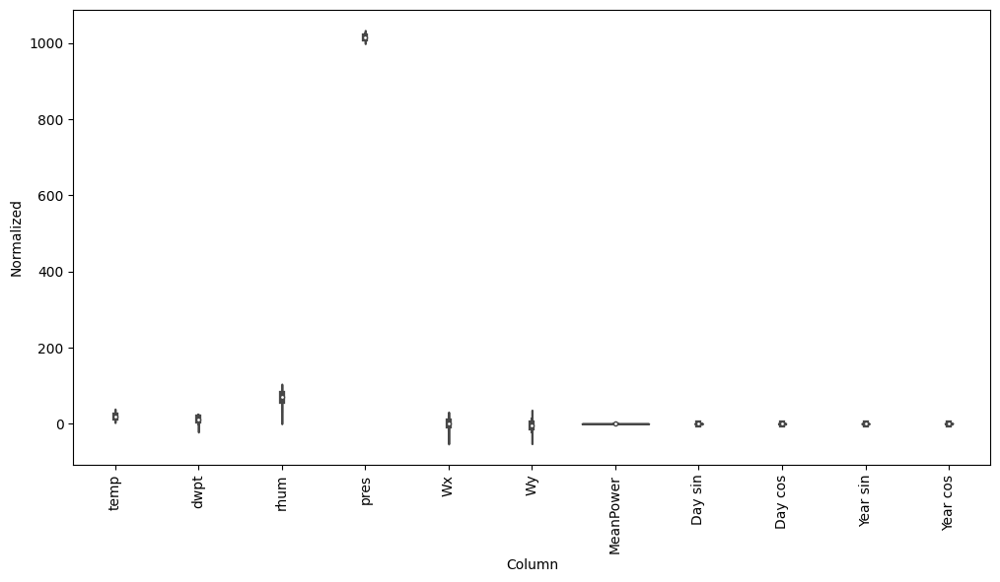

In [ ]:
# Standardize the entire DataFrame using the mean and std from the training dataset
df_std = (df - train_mean) / train_std

# Melt the DataFrame to transform it to long format for visualization
df_std = df_std.melt(var_name='Column', value_name='Normalized')

# Set up the figure and axis for the violin plot
plt.figure(figsize=(12, 6))
ax = sns.violinplot(x='Column', y='Normalized', data=df_std)

# Rotate x-axis labels for better readability
_ = ax.set_xticklabels(df.keys(), rotation=90)


Some features do have long tails, but there are no obvious errors

In [ ]:
print(df.isna().sum())

temp         0
dwpt         0
rhum         0
pres         0
Wx           0
Wy           0
MeanPower    0
Day sin      0
Day cos      0
Year sin     0
Year cos     0
dtype: int64


In [ ]:
df

,temp,dwpt,rhum,pres,Wx,Wy,MeanPower,Day sin,Day cos,Year sin,Year cos
2016-01-01 00:00:00,16.1,5.1,48.0,1017.6,7.199221,-8.579698,0.000304,-1.407890e-12,1.000000,-0.002666,0.999996
2016-01-01 01:00:00,15.6,5.5,51.0,1018.1,7.200818,-6.042204,0.000303,2.588190e-01,0.965926,-0.001950,0.999998
2016-01-01 02:00:00,14.4,4.4,51.0,1018.3,7.141664,-2.599353,0.000302,5.000000e-01,0.866025,-0.001233,0.999999
2016-01-01 03:00:00,13.9,4.5,53.0,1018.7,0.000000,-0.000000,0.000305,7.071068e-01,0.707107,-0.000516,1.000000
2016-01-01 04:00:00,13.3,4.4,55.0,1018.7,0.000000,-0.000000,0.000312,8.660254e-01,0.500000,0.000201,1.000000
...,...,...,...,...,...,...,...,...,...,...,...
2020-02-29 19:00:00,18.9,13.3,70.0,1019.6,-14.376022,-8.300000,0.000778,-9.659258e-01,0.258819,0.855457,0.517874
2020-02-29 20:00:00,19.4,14.0,71.0,1019.1,-12.817176,-7.400000,0.000779,-8.660254e-01,0.500000,0.855828,0.517261
2020-02-29 21:00:00,18.9,14.0,73.0,1018.3,-12.716338,-10.670274,0.000778,-7.071068e-01,0.707107,0.856198,0.516647
2020-02-29 22:00:00,18.9,12.9,68.0,1017.8,-9.513257,-11.337458,0.000776,-5.000000e-01,0.866025,0.856568,0.516033


#5.Data windowing 1

prediction 24 hours into the future, given 24 hours of history
timestep= 60mins= 1 hour
window size 60 mins=1 day

In [ ]:
class WindowGenerator():
    def __init__(self, input_width, label_width, shift,
                 train_df=train_df, val_df=val_df, test_df=test_df,
                 label_columns=None):
        # Store the raw data.
        self.train_df = train_df
        self.val_df = val_df
        self.test_df = test_df

        # Work out the label column indices.
        self.label_columns = label_columns
        if label_columns is not None:
            # Create a dictionary to map label column names to indices
            self.label_columns_indices = {name: i for i, name in enumerate(label_columns)}

        # Create a dictionary to map all column names to indices
        self.column_indices = {name: i for i, name in enumerate(train_df.columns)}

        # Work out the window parameters.
        self.input_width = input_width
        self.label_width = label_width
        self.shift = shift

        # Calculate the total window size
        self.total_window_size = input_width + shift

        # Define slices and indices for input and label windows
        self.input_slice = slice(0, input_width)
        self.input_indices = np.arange(self.total_window_size)[self.input_slice]

        self.label_start = self.total_window_size - self.label_width
        self.labels_slice = slice(self.label_start, None)
        self.label_indices = np.arange(self.total_window_size)[self.labels_slice]

    def __repr__(self):
        # Return a string representation of the class
        return '\n'.join([
            f'Total window size: {self.total_window_size}',
            f'Input indices: {self.input_indices}',
            f'Label indices: {self.label_indices}',
            f'Label column name(s): {self.label_columns}'
        ])


***window object*** 24 time steps aead prediction with 24 time steps behind

In [ ]:
OUT_STEPS = 24
multi_window = WindowGenerator(input_width=24,label_width=OUT_STEPS,shift=OUT_STEPS)

##split

In [ ]:
def split_window(self, features):
  inputs = features[:, self.input_slice, :]
  labels = features[:, self.labels_slice, :]
  if self.label_columns is not None:
    labels = tf.stack(
        [labels[:, :, self.column_indices[name]] for name in self.label_columns],
        axis=-1)

  # Slicing doesn't preserve static shape information, so set the shapes
  # manually. This way the `tf.data.Datasets` are easier to inspect.
  inputs.set_shape([None, self.input_width, None])
  labels.set_shape([None, self.label_width, None])

  return inputs, labels

WindowGenerator.split_window = split_window

## 4. Create `tf.data.Dataset`s

Finally, this `make_dataset` method will take a time series DataFrame and convert it to a `tf.data.Dataset` of `(input_window, label_window)` pairs using the `tf.keras.utils.timeseries_dataset_from_array` function:

In [ ]:
def make_dataset(self, data):
  data = np.array(data, dtype=np.float32)
  ds = tf.keras.utils.timeseries_dataset_from_array(
      data=data,
      targets=None,
      sequence_length=self.total_window_size,
      sequence_stride=1,
      shuffle=True,
      batch_size=32,)

  ds = ds.map(self.split_window)

  return ds

WindowGenerator.make_dataset = make_dataset

The `WindowGenerator` object holds training, validation, and test data.


In [ ]:
@property
def train(self):
  return self.make_dataset(self.train_df)

@property
def val(self):
  return self.make_dataset(self.val_df)

@property
def test(self):
  return self.make_dataset(self.test_df)

@property
def example(self):
  """Get and cache an example batch of `inputs, labels` for plotting."""
  result = getattr(self, '_example', None)
  if result is None:
    # No example batch was found, so get one from the `.train` dataset
    result = next(iter(self.train))
    # And cache it for next time
    self._example = result
  return result

WindowGenerator.train = train
WindowGenerator.val = val
WindowGenerator.test = test
WindowGenerator.example = example

Plot random 3 samples from the train dataset

In [ ]:
def plot(self, model=None, plot_col='MeanPower', max_subplots=3):
  inputs, labels = self.example
  plt.figure(figsize=(12, 8))
  plot_col_index = self.column_indices[plot_col]
  max_n = min(max_subplots, len(inputs))
  for n in range(max_n):
    plt.subplot(max_n, 1, n+1)
    plt.ylabel(f'{plot_col} [normed]')
    plt.plot(self.input_indices, inputs[n, :, plot_col_index],
             label='Inputs', marker='.', zorder=-10)

    if self.label_columns:
      label_col_index = self.label_columns_indices.get(plot_col, None)
    else:
      label_col_index = plot_col_index

    if label_col_index is None:
      continue

    plt.scatter(self.label_indices, labels[n, :, label_col_index],
                edgecolors='k', label='Labels', c='#2ca02c', s=64)
    if model is not None:
      predictions = model(inputs)
      plt.scatter(self.label_indices, predictions[n, :, label_col_index],
                  marker='X', edgecolors='k', label='Predictions',
                  c='#ff7f0e', s=64)

    if n == 0:
      plt.legend()

  plt.xlabel('Time [h]')

WindowGenerator.plot = plot

#Baseline model (Repeat)

Since this task is to predict 24 hours into the future, given 24 hours of the past,simple approach is to repeat the previous day, assuming tomorrow will be similar:


In [ ]:
multi_val_performance = {}
multi_performance = {}

227/227 [==============================] - 1s 4ms/step - loss: 0.4071 - mean_absolute_error: 0.3289


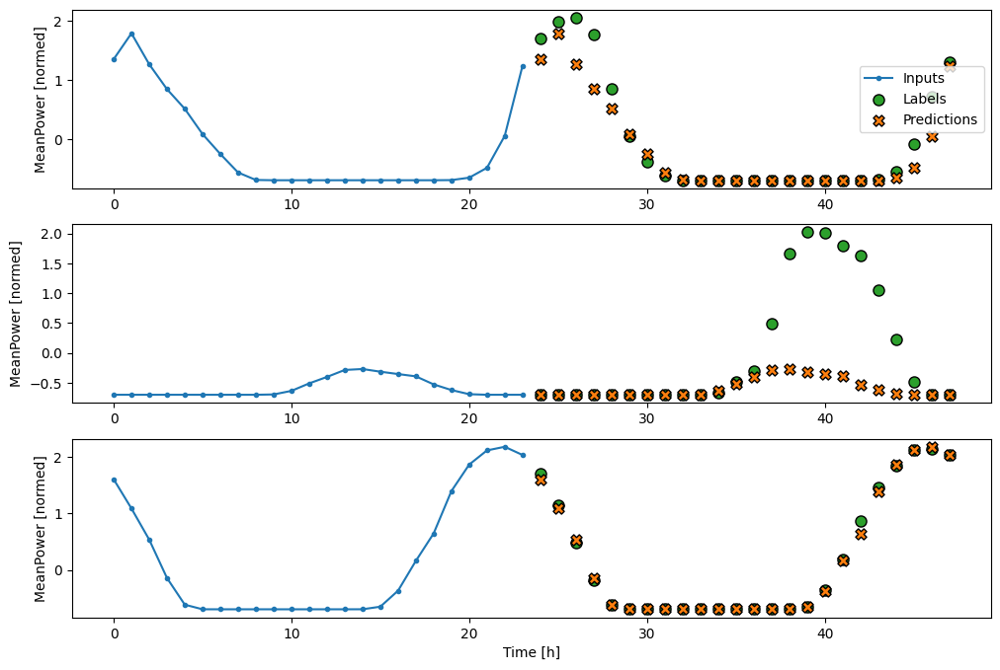

In [ ]:
class RepeatBaseline(tf.keras.Model):
  def call(self, inputs):
    return inputs

repeat_baseline = RepeatBaseline()
repeat_baseline.compile(loss=tf.keras.losses.MeanSquaredError(),
                        metrics=[tf.keras.metrics.MeanAbsoluteError()])

multi_val_performance['Repeat'] = repeat_baseline.evaluate(multi_window.val)
multi_performance['Repeat'] = repeat_baseline.evaluate(multi_window.test, verbose=0)
multi_window.plot(repeat_baseline)

#**packaged training procedure function**

In [ ]:
# Import TensorFlow library
import tensorflow as tf

# Maximum number of training epochs
MAX_EPOCHS = 50

# Function to compile and fit a neural network model
def compile_and_fit(model, window, patience=5):
    # Define early stopping callback
    early_stopping = tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',     # Monitor validation loss
        patience=patience,       # Number of epochs with no improvement after which training will be stopped
        mode='min'               # Stop when the monitored metric ('val_loss') stops decreasing (minimizing)
    )

    # Compile the model
    model.compile(
        loss=tf.keras.losses.MeanSquaredError(),           # Use Mean Squared Error loss function
        optimizer=tf.keras.optimizers.Adam(),              # Use the Adam optimizer
        metrics=[tf.keras.metrics.MeanAbsoluteError()]    # Monitor Mean Absolute Error metric
    )

    # Train the model
    history = model.fit(
        window.train,            # Training data
        epochs=MAX_EPOCHS,        # Maximum number of training epochs
        validation_data=window.val,  # Validation data
        callbacks=[early_stopping]   # List of callbacks, including early stopping
    )

    # Return the training history
    return history

# CNN

**Single-shot models**
One high-level approach to this problem is to use a "single-shot" model, where the model makes the entire sequence prediction in a single step


convolutional model with predict multiple steps(42time steps) using past 24 time steps

predict all features

####Conv1D

In [ ]:
# Set the convolution width
CONV_WIDTH = 24

# Create a Sequential model for the convolutional model
cnn_model = tf.keras.Sequential([
    # Shape [batch, time, features] => [batch, CONV_WIDTH, features]
   # tf.keras.layers.Lambda(lambda x: x[:, -CONV_WIDTH:, :]),
    # Shape => [batch, 1, conv_units]
    tf.keras.layers.Conv1D(256, activation='relu', kernel_size=(CONV_WIDTH)),
    # Shape => [batch, 1, out_steps*features]
    tf.keras.layers.Dense(OUT_STEPS*num_features,
                          kernel_initializer=tf.initializers.zeros()),
    # Shape => [batch, out_steps, features]
    #tf.keras.layers.Dense(128, activation='relu'),  # Add another dense layer with 128 units and ReLU activation
    tf.keras.layers.Reshape([OUT_STEPS, num_features])
    #tf.keras.layers.Dense(units=32, activation='relu'),
    #f.keras.layers.Dense(units=1),
])

history = compile_and_fit(cnn_model, multi_window)# Train the convolutional model using compile_and_fit function
IPython.display.clear_output()# Clear the IPython display



227/227 [==============================] - 1s 4ms/step - loss: 0.2019 - mean_absolute_error: 0.2590


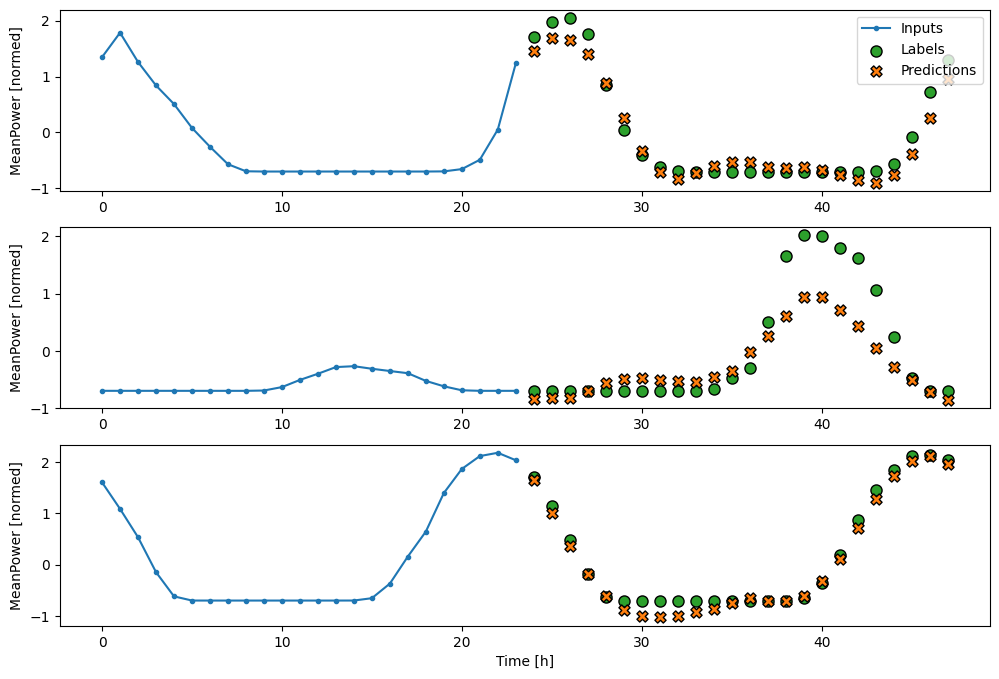

In [ ]:
# Evaluate
multi_val_performance['1D_Conv'] = cnn_model.evaluate(multi_window.val)
multi_performance['1D_Conv'] = cnn_model.evaluate(multi_window.test, verbose=0)

# Plot the performance
multi_window.plot(cnn_model)

####lstm cnn

In [ ]:
# Set the convolution width
CONV_WIDTH = 8

# Create a Sequential model for the convolutional model
cnn_lstm_model = tf.keras.Sequential([
    # Shape [batch, time, features] => [batch, CONV_WIDTH, features]
    #tf.keras.layers.Lambda(lambda x: x[:, -CONV_WIDTH:, :]),
    # Shape => [batch, 1, conv_units]
    #tf.keras.layers.Conv1D(256, activation='relu', kernel_size=(CONV_WIDTH)),
    tf.keras.layers.LSTM(256, activation='relu'),
    # Shape => [batch, 1, out_steps*features]
    tf.keras.layers.Dense(OUT_STEPS*num_features,
                          kernel_initializer=tf.initializers.zeros()),
    # Shape => [batch, out_steps, features]
    #tf.keras.layers.Dense(128, activation='relu'),  # Add another dense layer with 128 units and ReLU activation
    tf.keras.layers.Reshape([OUT_STEPS, num_features])
])


history = compile_and_fit(cnn_lstm_model, multi_window)# Train the convolutional model using compile_and_fit function
IPython.display.clear_output()# Clear the IPython display




227/227 [==============================] - 8s 35ms/step - loss: 0.2174 - mean_absolute_error: 0.2660


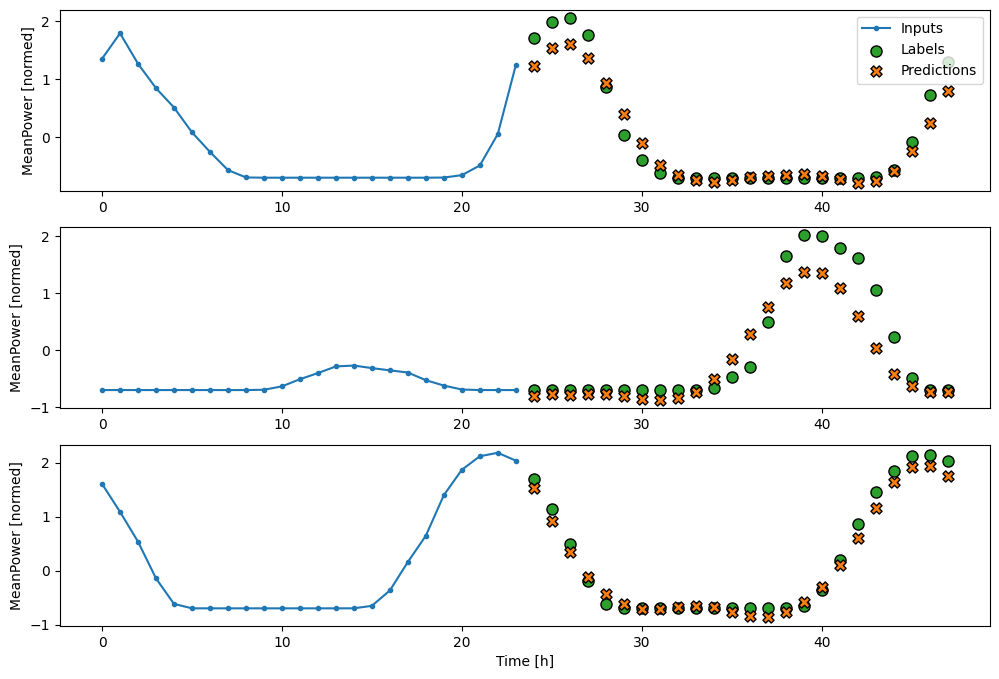

In [ ]:
# Evaluate
multi_val_performance['lstm_Conv'] = cnn_lstm_model.evaluate(multi_window.val)
multi_performance['lstm_Conv'] = cnn_lstm_model.evaluate(multi_window.test, verbose=0)

# Plot the performance
multi_window.plot(cnn_lstm_model)

#RNN

In [ ]:
# Rnn_lstm_model = tf.keras.Sequential([
#     # Shape [batch, time, features] => [batch, lstm_units].
#     # Adding more `lstm_units` just overfits more quickly.
#     tf.keras.layers.LSTM(256, return_sequences=False),
#     # Shape => [batch, out_steps*features].
#     tf.keras.layers.Dense(OUT_STEPS*num_features,
#                           kernel_initializer=tf.initializers.zeros()),
#     # Shape => [batch, out_steps, features].
#     tf.keras.layers.Reshape([OUT_STEPS, num_features])
# ])

# history = compile_and_fit(Rnn_lstm_model, multi_window)

# IPython.display.clear_output()

# multi_val_performance['LSTM'] = Rnn_lstm_model.evaluate(multi_window.val)
# multi_performance['LSTM'] = Rnn_lstm_model.evaluate(multi_window.test, verbose=0)


In [ ]:
#multi_window.plot(Rnn_lstm_model)

# Performance

There are clearly diminishing returns as a function of model complexity on this problem:

In [ ]:
train_df.mean()

temp        -2.057771e-17
dwpt        -1.779694e-17
rhum        -1.334770e-17
pres        -1.446001e-17
Wx          -5.978659e-18
Wy           3.114464e-17
MeanPower    1.446001e-17
Day sin     -3.469012e-17
Day cos     -3.962599e-18
Year sin     8.898469e-18
Year cos     3.114464e-17
dtype: float64

In [ ]:
x = np.arange(len(multi_performance))
multi_performance

{'Repeat': [0.516864001750946, 0.376730740070343],
 '1D_Conv': [0.2633342146873474, 0.3029646873474121],
 'lstm_Conv': [0.3047036826610565, 0.32818087935447693]}

###Loss comparision

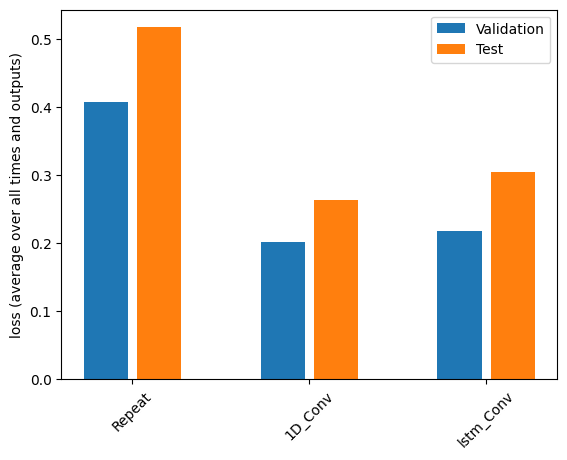

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

x = np.arange(len(multi_performance))
width = 0.25

val_loss = [v[0] for v in multi_val_performance.values()]
test_loss = [v[0] for v in multi_performance.values()]

plt.bar(x - 0.15, val_loss, width, label='Validation')
plt.bar(x + 0.15, test_loss, width, label='Test')
plt.xticks(ticks=x, labels=multi_performance.keys(), rotation=45)
plt.ylabel(f'loss (average over all times and outputs)')
_ = plt.legend()
plt.show()

The metrics for the multi-output models in the first half of this tutorial show the performance averaged across all output features. These performances are similar but also averaged across output time steps.

###MEA comparision

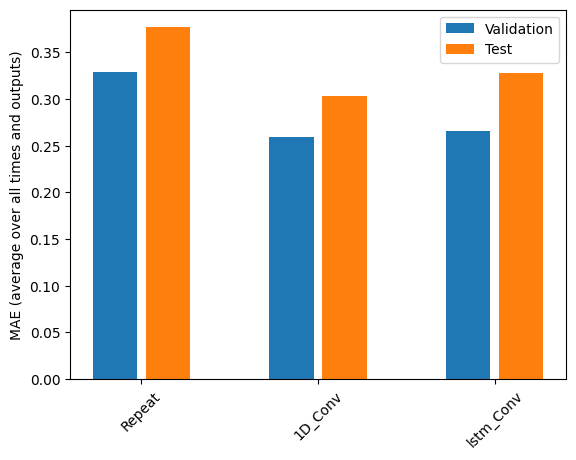

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

x = np.arange(len(multi_performance))
width = 0.25

val_mae = [v[1] for v in multi_val_performance.values()]
test_mae = [v[1] for v in multi_performance.values()]

plt.bar(x - 0.15, val_mae, width, label='Validation')
plt.bar(x + 0.15, test_mae, width, label='Test')
plt.xticks(ticks=x, labels=multi_performance.keys(), rotation=45)
plt.ylabel(f'MAE (average over all times and outputs)')
_ = plt.legend()
plt.show()